In [ ]:
# разработчик Дубинец А.В. 
# 16/05/2023
# Задача №1232 проект "Определение качества вина"

## 1. Загрузка библиотек

In [4]:
#https://www.kaggle.com/code/mgmarques/wines-type-and-quality-classification-exercises
import pandas as pd
from pandas_profiling import ProfileReport
import numpy as np
from scipy import stats
import os
import pickle

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder
from sklearn.pipeline import make_pipeline 
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.svm import SVC

from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, RandomForestClassifier
from sklearn.metrics import r2_score, mean_squared_error, classification_report
import shap

In [3]:
!pip3 freeze > requirements.txt

## 2.Загрузка данных

In [5]:
df = pd.read_csv(r'C:\Users\a.dubinets\Desktop\Обучение\6. Менеджмент дата проекта\4.Сохранение результатов эксперимента\HW\Wines Type and Quality\Dataset\external\winequalityN.csv')
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,6487.000000,6489.000000,6494.000000,6495.000000,6495.000000,6497.000000,6497.000000,6497.000000,6488.000000,6493.000000,6497.000000,6497.000000
mean,7.216579,0.339691,0.318722,5.444326,0.056042,30.525319,115.744574,0.994697,3.218395,0.531215,10.491801,5.818378
std,1.296750,0.164649,0.145265,4.758125,0.035036,17.749400,56.521855,0.002999,0.160748,0.148814,1.192712,0.873255
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000,5.000000
50%,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000,6.000000
75%,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996990,3.320000,0.600000,11.300000,6.000000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,9.000000


## 3. Исследование данных и визуализация

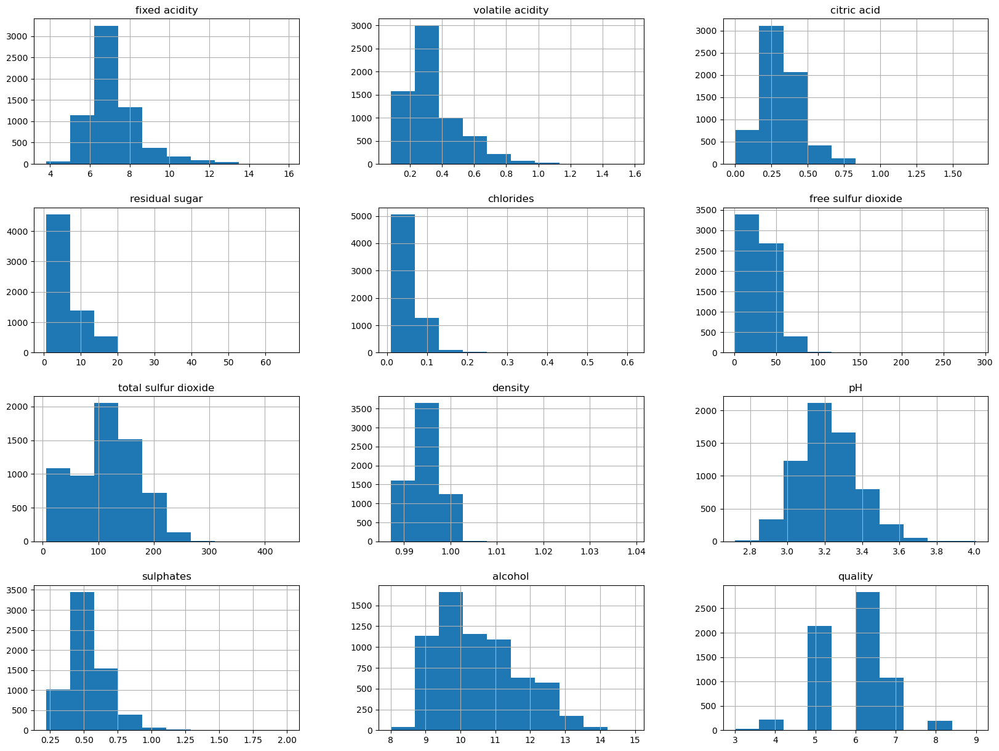

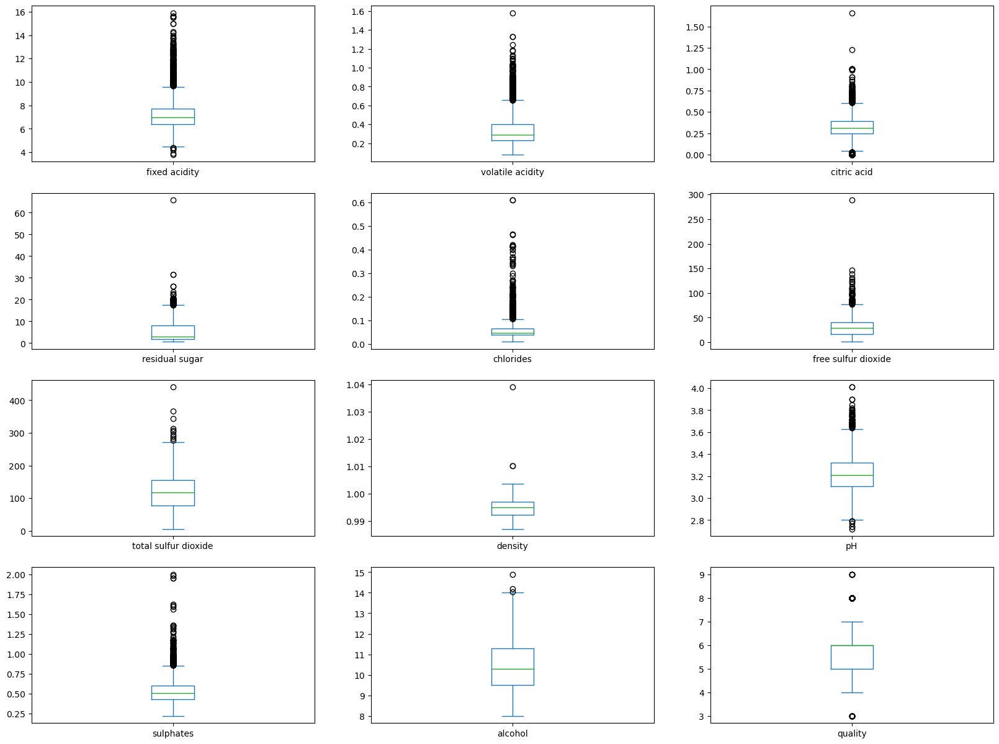

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.


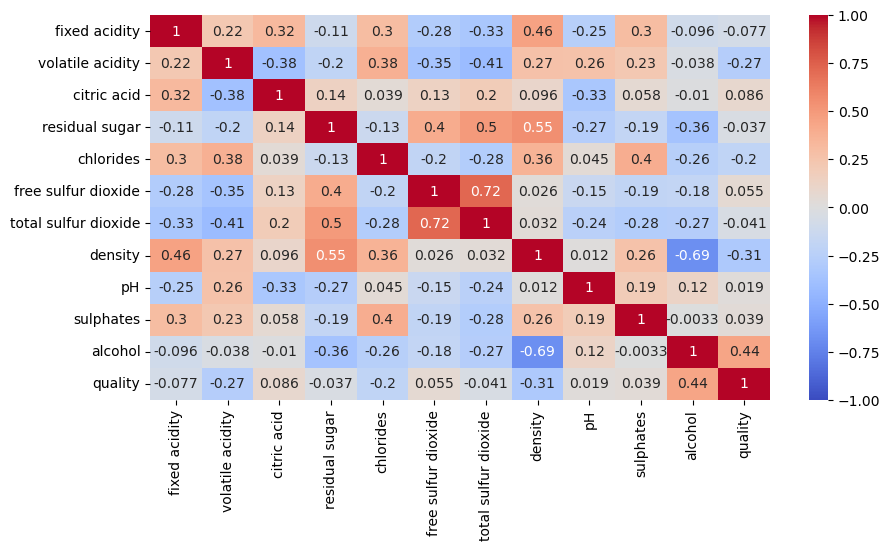

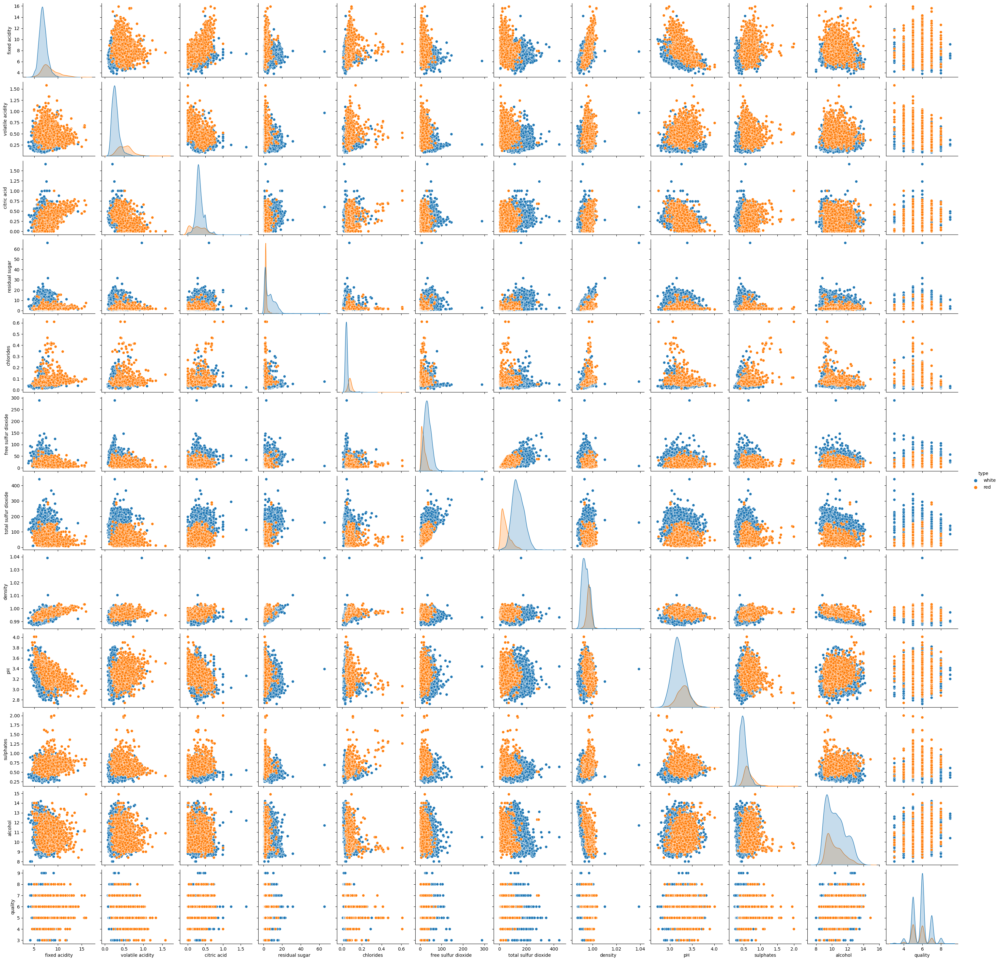

In [18]:
path = r'C:\Users\a.dubinets\Desktop\Обучение\6. Менеджмент дата проекта\4.Сохранение результатов эксперимента\HW\Wines Type and Quality\Report'

# Histograms of each feature
df.hist(bins=10, figsize=(20,15))
plt.savefig(path+"\Histograms.jpg")
plt.show()


# Box plots of each feature
df.plot(kind='box', subplots=True, layout=(4,3), sharex=False, sharey=False, figsize=(20,15))
plt.savefig(path+"\Box_plots.jpg")
plt.show()


# Correlation matrix heatmap
plt.figure(figsize=(10, 5))
sns.heatmap(df.corr(), vmin = -1, vmax = +1, annot = True, cmap = 'coolwarm')
plt.savefig(path+"\Correlation.jpg")
plt.show()


# Comparing histograms 
sns.pairplot(df, hue='type')
plt.savefig(path+"\Comparing_histograms.jpg")

In [4]:
profile = ProfileReport(df, title="Pandas Profiling Report")
profile.to_file(r'C:\Users\a.dubinets\Desktop\Обучение\6. Менеджмент дата проекта\4.Сохранение результатов эксперимента\HW\Wines Type and Quality\Report\my_report.html")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## 4.Выполним предварительную обработку (удалим выбросы и заполним пустоту):

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   type                  6497 non-null   object 
 1   fixed acidity         6487 non-null   float64
 2   volatile acidity      6489 non-null   float64
 3   citric acid           6494 non-null   float64
 4   residual sugar        6495 non-null   float64
 5   chlorides             6495 non-null   float64
 6   free sulfur dioxide   6497 non-null   float64
 7   total sulfur dioxide  6497 non-null   float64
 8   density               6497 non-null   float64
 9   pH                    6488 non-null   float64
 10  sulphates             6493 non-null   float64
 11  alcohol               6497 non-null   float64
 12  quality               6497 non-null   int64  
dtypes: float64(11), int64(1), object(1)
memory usage: 660.0+ KB


In [6]:
# Remove outliers 
column = ['fixed acidity','volatile acidity','citric acid','residual sugar','chlorides','free sulfur dioxide','total sulfur dioxide','density','pH','sulphates','alcohol']
Q1 = df[column].quantile(0.10)
Q3 = df[column].quantile(0.90)
IQR = Q3 - Q1
df2 = df[~((df[column] < (Q1 - 1.5*IQR)) | (df[column] > (Q3 + 1.5*IQR))).any(axis=1)]

# Fill missing values with mean value of each column
df2.fillna(df.mean(), inplace=True)
df2.to_csv (r'C:\Users\a.dubinets\Desktop\Обучение\6. Менеджмент дата проекта\4.Сохранение результатов эксперимента\HW\Wines Type and Quality\Dataset\intermid\1_winequality_clear.csv', index= False )

The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [30]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6355 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   type                  6355 non-null   object 
 1   fixed acidity         6355 non-null   float64
 2   volatile acidity      6355 non-null   float64
 3   citric acid           6355 non-null   float64
 4   residual sugar        6355 non-null   float64
 5   chlorides             6355 non-null   float64
 6   free sulfur dioxide   6355 non-null   float64
 7   total sulfur dioxide  6355 non-null   float64
 8   density               6355 non-null   float64
 9   pH                    6355 non-null   float64
 10  sulphates             6355 non-null   float64
 11  alcohol               6355 non-null   float64
 12  quality               6355 non-null   int64  
dtypes: float64(11), int64(1), object(1)
memory usage: 695.1+ KB


In [7]:
# LabelEncoder type column
class_tp = LabelEncoder()
y_tp = class_tp.fit_transform(df2.type.values) # 1 - White; 0 - Red
df3 =df2.copy()
df3['color'] = y_tp
df3 = df3.drop('type', axis=1)
df3

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,color
0,7.0,0.270,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.450000,8.8,6,1
1,6.3,0.300,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.490000,9.5,6,1
2,8.1,0.280,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.440000,10.1,6,1
3,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.400000,9.9,6,1
4,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.400000,9.9,6,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.580000,10.5,5,0
6493,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.531215,11.2,6,0
6494,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.750000,11.0,6,0
6495,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.710000,10.2,5,0


## 5.Выбор характеристик.

In [22]:
# LabelEncoder type column
class_tp = LabelEncoder()
y_tp = class_tp.fit_transform(df2.type.values) # 1 - White; 0 - Red
df3 =df2.copy()
df3['color'] = y_tp
df3 = df3.drop('type', axis=1)

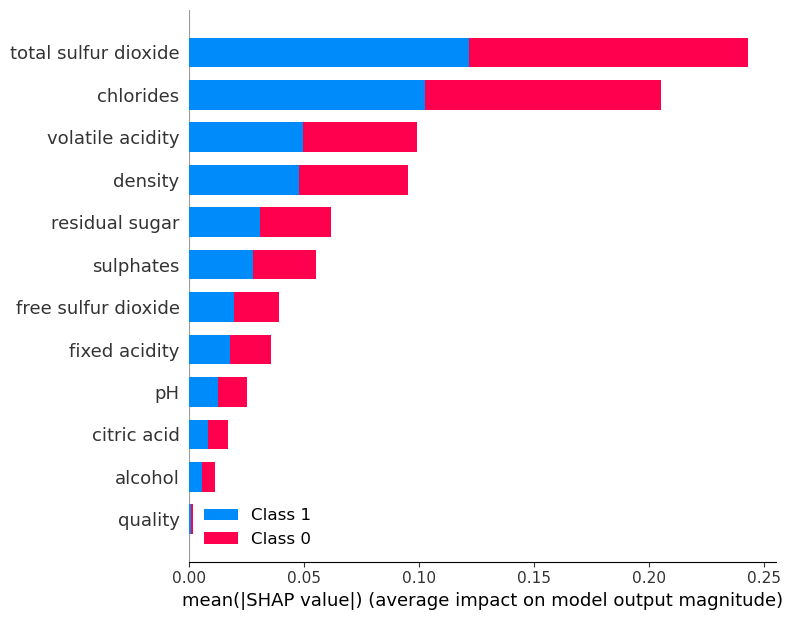

In [23]:
# Feature selection using shap
X = df3.drop('color', axis=1)
Y = df3['color']
rf_model = RandomForestClassifier()
rf_model.fit(X, Y)

explainer = shap.TreeExplainer(rf_model)
shap_values = explainer.shap_values(X)
plt.savefig(path+"\shap_value.jpg")
shap.summary_plot(shap_values, X)

In [24]:
df3.drop(column, axis=1).to_csv (r'C:\Users\a.dubinets\Desktop\Обучение\6. Менеджмент дата проекта\4.Сохранение результатов эксперимента\HW\Wines Type and Quality\Dataset\intermid\winequality_drop.csv', index= False )

## 6.Масштабирование функций и разбиение данных на обучающий и тестовый наборы:

In [ ]:
column = ['quality','alcohol']
X = df3.drop(column, axis=1)
y = df3['color']

# Scale features using MinMaxScaler and split data into training and test sets (80/20 split)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2)


## 7.Проверка нескольких моделей, тестирование и сравнение.

In [11]:
# Build multiple models (Logistic Regression, Random Forest Classifier, SVC) and evaluate their performance 
lr_model = LogisticRegression(max_iter=1000) 
lr_model.fit(X_train, y_train)
lr_pred = lr_model.predict(X_test)


rf_model = RandomForestClassifier(n_estimators=100)   
rf_model.fit(X_train, y_train)
rf_pred = rf_model.predict(X_test)

svc_model = SVC(kernel = 'poly', degree=3)
svc_model.fit(X_train, y_train)
svc_pred = svc_model.predict(X_test)


print('Logistic Regression:',classification_report(y_test,lr_pred))
print('Random Forest Classifier:',classification_report(y_test,rf_pred))
print('SVC:',classification_report(y_test,svc_pred))


Logistic Regression:               precision    recall  f1-score   support

           0       0.93      0.90      0.92       300
           1       0.97      0.98      0.98       971

    accuracy                           0.96      1271
   macro avg       0.95      0.94      0.95      1271
weighted avg       0.96      0.96      0.96      1271

Random Forest Classifier:               precision    recall  f1-score   support

           0       0.95      0.97      0.96       300
           1       0.99      0.98      0.99       971

    accuracy                           0.98      1271
   macro avg       0.97      0.98      0.97      1271
weighted avg       0.98      0.98      0.98      1271

SVC:               precision    recall  f1-score   support

           0       0.97      0.85      0.91       300
           1       0.96      0.99      0.97       971

    accuracy                           0.96      1271
   macro avg       0.96      0.92      0.94      1271
weighted avg       0.9

In [51]:
#call the classification_report first and then our new function

report_lr  = classification_report(y_test,lr_pred, output_dict=True)
report_rf  = classification_report(y_test,rf_pred, output_dict=True)
report_svc = classification_report(y_test,svc_pred, output_dict=True)

report_lr=pd.DataFrame(report_lr)
report_lr.to_csv(r'C:\Users\a.dubinets\Desktop\Обучение\6. Менеджмент дата проекта\4.Сохранение результатов эксперимента\HW\Wines Type and Quality\Result\report_lr.csv')  

report_rf=pd.DataFrame(report_lr)
report_rf.to_csv(r'C:\Users\a.dubinets\Desktop\Обучение\6. Менеджмент дата проекта\4.Сохранение результатов эксперимента\HW\Wines Type and Quality\Result\report_rf.csv')  

report_svc=pd.DataFrame(report_lr)
report_svc.to_csv(r'C:\Users\a.dubinets\Desktop\Обучение\6. Менеджмент дата проекта\4.Сохранение результатов эксперимента\HW\Wines Type and Quality\Result\report_svc.csv')  

In [52]:
# save all model
os.chdir(r"C:\Users\a.dubinets\Desktop\Обучение\6. Менеджмент дата проекта\4.Сохранение результатов эксперимента\HW\Wines Type and Quality\Result") 
pickle.dump(lr_model,open("lr_model.pkl","wb")) 
pickle.dump(lr_model,open("rf_model.pkl","wb")) 
pickle.dump(lr_model,open("gb_model.pkl","wb")) 
